# Energy Demand and Renewable Generation Forecasting - Timeseries Data Forecasting

This project provides a comprehensive comparison of time series forecasting techniques — including **ARIMA**, **SARIMA** and **Facebook Prophet** — using real-world energy data. It includes:

* Data preprocessing
* Forecasting with ARIMA, SARIMA and Prophet
* Visualization of predictions
* Model evaluation and comparison

## 📦 1. Import Required Libraries

In [17]:
# !pip install pmdarima

In [18]:
# --- Core Libraries ---
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# --- Visualization Libraries ---
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# --- Time Series Decomposition & Analysis ---
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

# --- Forecasting Models ---
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

# --- Evaluation Metrics ---
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    mean_absolute_percentage_error,
    r2_score
)

## 2. Load & Inspect Data

**Data Source Link:** [opsd-time_series-2020-10-06](https://data.open-power-system-data.org/time_series/)

In [19]:
file_path = r"D:\Learnings\My_Projects\Master_Projects\Energy Demand & Renewable Generation Forecasting\data\row\opsd-time_series-2020-10-06\time_series_60min_singleindex.csv"
df = pd.read_csv(file_path, parse_dates=["utc_timestamp"])

df = df.set_index('utc_timestamp')
df.index = df.index.tz_localize(None)
print(df.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 50401 entries, 2014-12-31 23:00:00 to 2020-09-30 23:00:00
Columns: 299 entries, cet_cest_timestamp to UA_load_forecast_entsoe_transparency
dtypes: float64(298), object(1)
memory usage: 115.4+ MB
None


In [20]:
# Infer the frequency and set it if possible
inferred_freq = pd.infer_freq(df.index)
if inferred_freq:
    df.index.freq = inferred_freq
    print(f"Inferred frequency: {df.index.freq}")
else:
    print("Could not reliably infer the frequency of the data. Please set it manually if known.")


Inferred frequency: <Hour>


In [21]:
print("\nMissing values: ")
df.isnull().sum().head()


Missing values: 


cet_cest_timestamp                          0
AT_load_actual_entsoe_transparency          1
AT_load_forecast_entsoe_transparency        1
AT_price_day_ahead                      17556
AT_solar_generation_actual                 62
dtype: int64

In [22]:
at_cols = [col for col in df.columns if col.startswith("AT_")]
df = df[at_cols]
df.shape

(50401, 5)

In [23]:
df.head()

,AT_load_actual_entsoe_transparency,AT_load_forecast_entsoe_transparency,AT_price_day_ahead,AT_solar_generation_actual,AT_wind_onshore_generation_actual
utc_timestamp,,,,,
2014-12-31 23:00:00,NaN,NaN,NaN,NaN,NaN
2015-01-01 00:00:00,5946.0,6701.0,35.0,NaN,69.0
2015-01-01 01:00:00,5726.0,6593.0,45.0,NaN,64.0
2015-01-01 02:00:00,5347.0,6482.0,41.0,NaN,65.0
2015-01-01 03:00:00,5249.0,6454.0,38.0,NaN,64.0


## 3. Data Preprocessing

In [24]:
# Handle missing values
df['AT_solar_generation_actual'] = df['AT_solar_generation_actual'].fillna(0)
df = df.ffill()  # Forward fill other missing values

# Create time features
df['hour'] = df.index.hour
df['day_of_week'] = df.index.dayofweek
df['month'] = df.index.month

# Select target variable
target = 'AT_load_actual_entsoe_transparency'
ts = df[target]
ts.shape

(50401,)

In [25]:
ts.info()

<class 'pandas.core.series.Series'>
DatetimeIndex: 50401 entries, 2014-12-31 23:00:00 to 2020-09-30 23:00:00
Freq: h
Series name: AT_load_actual_entsoe_transparency
Non-Null Count  Dtype  
--------------  -----  
50400 non-null  float64
dtypes: float64(1)
memory usage: 787.5 KB


## 4. Exploratory Data Analysis

In [26]:
# Basic statistics
df.describe()

,AT_load_actual_entsoe_transparency,AT_load_forecast_entsoe_transparency,AT_price_day_ahead,AT_solar_generation_actual,AT_wind_onshore_generation_actual,hour,day_of_week,month
count,50400.000000,50400.000000,50400.000000,50401.000000,50400.000000,50401.000000,50401.000000,50401.000000
mean,7070.148631,7039.848552,43.674663,135.113708,729.300258,11.500228,2.999980,6.325827
std,1400.263167,1355.382837,18.006174,198.889502,691.767878,6.922376,2.000005,3.386848
min,664.000000,3739.000000,-76.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,5941.000000,5941.000000,29.000000,0.000000,163.000000,6.000000,1.000000,3.000000
50%,7032.000000,7018.000000,42.000000,17.000000,492.000000,12.000000,3.000000,6.000000
75%,8079.000000,7986.000000,62.000000,224.000000,1140.000000,18.000000,5.000000,9.000000
max,10803.000000,11608.000000,187.000000,1166.000000,2969.000000,23.000000,6.000000,12.000000


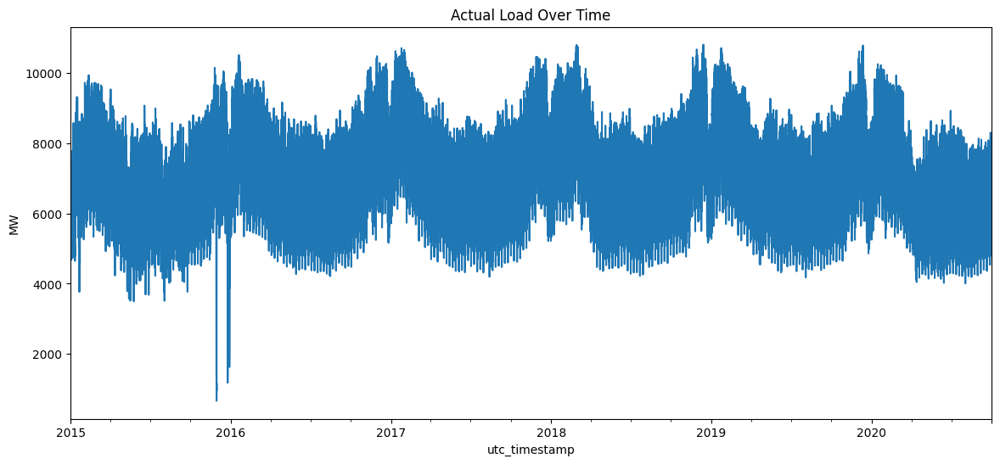

In [27]:
# Time series plot
plt.figure(figsize=(14,6))
ts.plot(title='Actual Load Over Time')
plt.ylabel('MW')
plt.show()

In [28]:
ts = ts.interpolate(method='linear')
ts = ts.dropna()
print("Missing Values: ", ts.isnull().sum())  # Count the total number of NaNs
print(ts[ts.isnull()])

Missing Values:  0
Series([], Freq: h, Name: AT_load_actual_entsoe_transparency, dtype: float64)


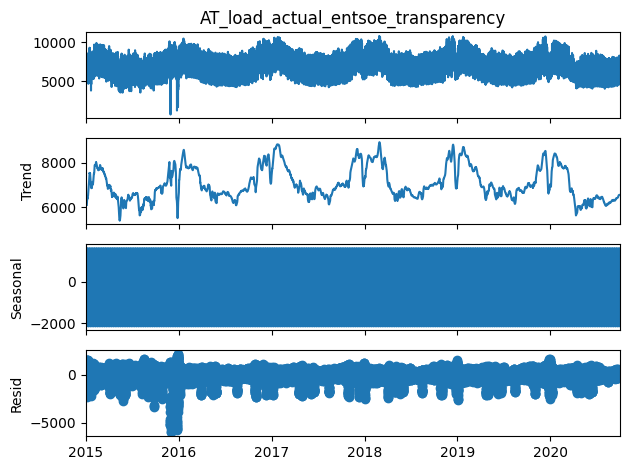

In [29]:
# Decomposition
result = seasonal_decompose(ts, period=24*7)  # Weekly seasonality
result.plot()
plt.show()

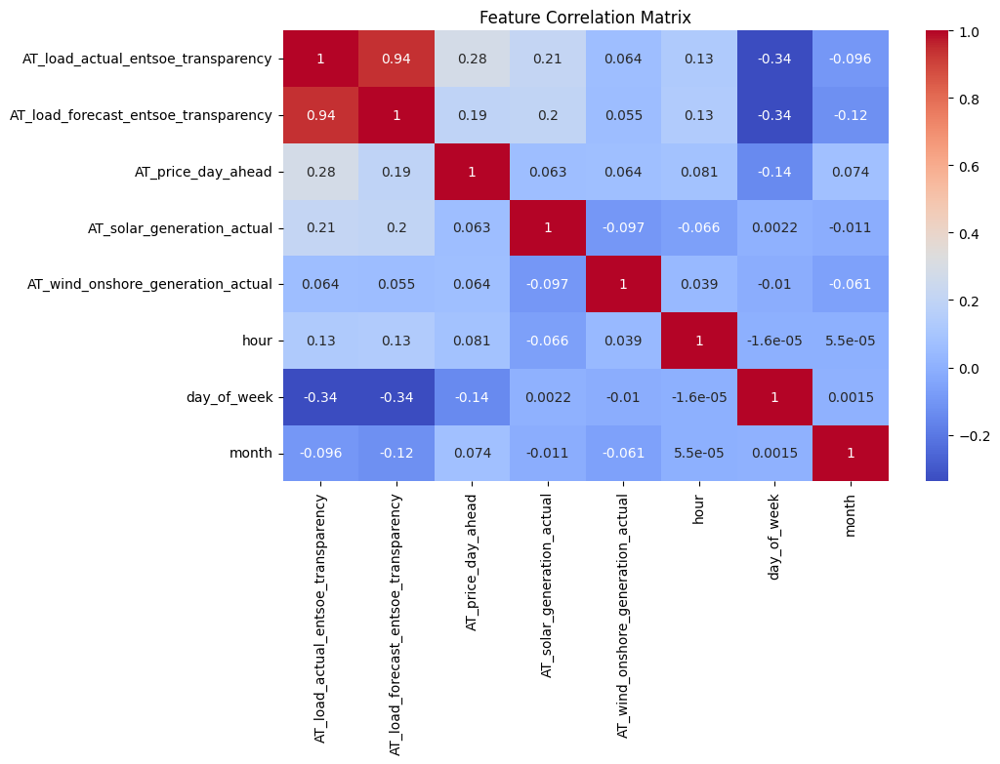

In [30]:
# Correlation heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Matrix')
plt.show()

## 5. Time Series Analysis

ADF Statistic: -16.6780076417694
p-value: 1.5248955982510834e-29


<Figure size 1400x600 with 0 Axes>

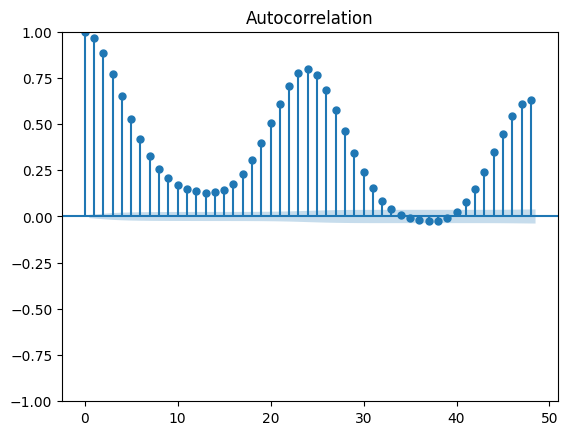

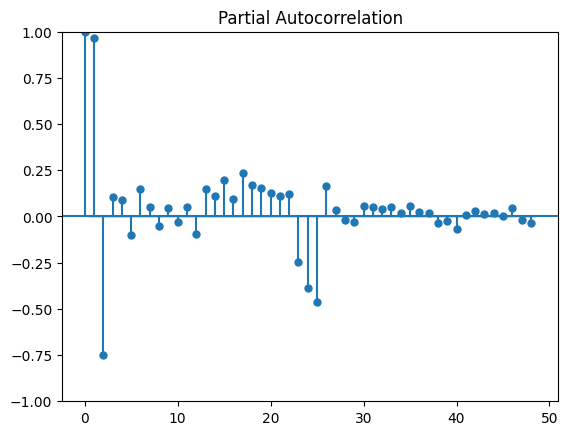

In [31]:
# Stationarity check
def test_stationarity(timeseries):
    # Dickey-Fuller test
    dftest = adfuller(timeseries, autolag='AIC')
    print('ADF Statistic:', dftest[0])
    print('p-value:', dftest[1])
    
test_stationarity(ts)

# ACF/PACF plots
plt.figure(figsize=(14,6))
plot_acf(ts, lags=48)
plot_pacf(ts, lags=48)
plt.show()

## 6. Forecasting with ARIMA

In [32]:
# Train-test split
train = ts['2015-01-01':'2015-02-10']
test = ts['2015-02-11':'2015-02-20']

### 6.1 Hyperparameter Tuning with Auto-ARIMA

Using `pmdarima` to automatically find optimal ARIMA parameters based on AIC (Akaike Information Criterion).

In [33]:
# Install pmdarima if not already installed
# Uncomment the line below to install
# !pip install pmdarima

import pmdarima as pm

print("Running Auto-ARIMA to find optimal parameters...")
print("This may take a few minutes...")

# Use a subset for faster tuning
train_sample = train.iloc[:len(train)//4]  # Use 25% of data for speed

# Auto-ARIMA with seasonal components
auto_model = pm.auto_arima(
    train_sample,
    seasonal=True,
    m=24,  # Daily seasonality for hourly data
    d=1,  # First difference for stationarity
    D=1,  # Seasonal difference
    trace=True,  # Show progress
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True,  # Faster stepwise search
    random_state=42,
    n_fits=50  # Limit iterations
)

print("\n" + "="*60)
print("OPTIMAL ARIMA PARAMETERS FOUND:")
print("="*60)
print(f"Order (p,d,q): {auto_model.order}")
print(f"Seasonal Order (P,D,Q,m): {auto_model.seasonal_order}")
print(f"AIC: {auto_model.aic():.2f}")
print("="*60)
print("\nModel Summary:")
print(auto_model.summary())

Running Auto-ARIMA to find optimal parameters...
This may take a few minutes...
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[24]             : AIC=inf, Time=8.28 sec
 ARIMA(0,1,0)(0,1,0)[24]             : AIC=3273.588, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[24]             : AIC=3183.777, Time=0.60 sec
 ARIMA(0,1,1)(0,1,1)[24]             : AIC=inf, Time=1.49 sec
 ARIMA(1,1,0)(0,1,0)[24]             : AIC=3275.434, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[24]             : AIC=3172.990, Time=2.53 sec
 ARIMA(1,1,0)(2,1,1)[24]             : AIC=inf, Time=8.06 sec
 ARIMA(1,1,0)(1,1,1)[24]             : AIC=3161.491, Time=2.30 sec
 ARIMA(1,1,0)(0,1,1)[24]             : AIC=inf, Time=2.52 sec
 ARIMA(1,1,0)(1,1,2)[24]             : AIC=inf, Time=7.69 sec
 ARIMA(1,1,0)(0,1,2)[24]             : AIC=3162.328, Time=9.19 sec
 ARIMA(1,1,0)(2,1,2)[24]             : AIC=inf, Time=11.89 sec
 ARIMA(0,1,0)(1,1,1)[24]             : AIC=3160.705, Time=2.26 sec
 ARIMA(0,1,0)(0,1,1)[24]           

In [34]:
# Fit ARIMA
model = ARIMA(train, order=(2,1,2))
model_fit = model.fit()

# Forecast
forecast = model_fit.forecast(steps=len(test))

# Evaluate
print(f'MAE: {mean_absolute_error(test, forecast)}')
print(f'RMSE: {np.sqrt(mean_squared_error(test, forecast))}')

MAE: 954.3642872990822
RMSE: 1110.9080443891935


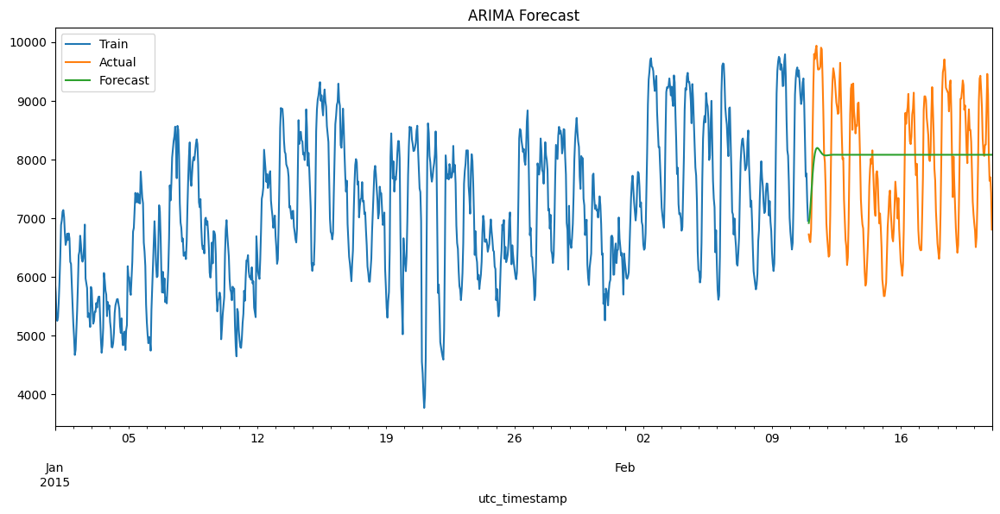

In [35]:
# Plot results
plt.figure(figsize=(14,6))
train.plot(label='Train')
test.plot(label='Actual')
forecast.plot(label='Forecast')
plt.legend()
plt.title('ARIMA Forecast')
plt.show()

In [36]:
def plot_time_series_comparison(train_data: pd.Series = None,
                                 test_data: pd.Series = None,
                                 forecast: pd.Series = None,
                                 model_name: str = "Forecast",
                                 title: str = "Time Series Comparison",
                                 actual_label: str = "Test Data",
                                 train_label: str = "Train Data",
                                 forecast_label: str = "Forecasted Data"):
    """
    Interactive Plotly version of time series comparison plot with improved legend placement.
    """

    fig = go.Figure()

    # Collect all values for dynamic y-axis range
    all_values = []

    if train_data is not None:
        train_data = train_data.sort_index()
        all_values.extend(train_data.values)
        fig.add_trace(go.Scatter(
            x=train_data.index, y=train_data.values,
            mode='lines', name=train_label,
            line=dict(color='blue', width=2)
        ))

    if test_data is not None:
        test_data = test_data.sort_index()
        all_values.extend(test_data.values)
        fig.add_trace(go.Scatter(
            x=test_data.index, y=test_data.values,
            mode='lines', name=actual_label,
            line=dict(color='green', width=2)
        ))

    if forecast is not None:
        forecast = forecast.sort_index()
        all_values.extend(forecast.values)
        fig.add_trace(go.Scatter(
            x=forecast.index, y=forecast.values,
            mode='lines', name=f"{model_name} {forecast_label}",
            line=dict(color='red', width=2, dash='dash')
        ))

    # Calculate y-axis buffer
    if all_values:
        y_min = min(all_values)
        y_max = max(all_values)
        y_range_buffer = (y_max - y_min) * 0.1 if y_max != y_min else 1
        y_range = [y_min, y_max + y_range_buffer]
    else:
        y_range = None

    fig.update_layout(
        title=dict(text=title, x=0.5, xanchor='center'),
        xaxis_title='Datetime',
        yaxis_title='Value',
        yaxis=dict(range=y_range),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1,
            bgcolor='rgba(255,255,255,0.5)',
            borderwidth=0
        ),
        template='plotly_white',
        hovermode='x unified',
        autosize=True,
        margin=dict(l=40, r=40, t=80, b=40)
    )

    fig.show()

In [37]:
# Plot with ARIMA forecast
plot_time_series_comparison(train_data=train, test_data=test, forecast=forecast,
                                model_name='ARIMA', title='ARIMA Model Performance')


In [41]:

train = df['2018-01-01':'2019-12-31']
test = df['2020-01-01':'2021-12-31']  # Empty - to be forecasted

# ### Model Training & Forecasting

target = 'AT_load_actual_entsoe_transparency'
exog_vars = ['AT_price_day_ahead', 'AT_solar_generation_actual', 'AT_wind_onshore_generation_actual']

# Calculate actual number of steps based on test data length
number_of_steps_hr = len(test)
print(f"Number of forecast steps: {number_of_steps_hr} hours")
print(f"Test period: {test.index[0]} to {test.index[-1]}")

# SARIMA Model
sarima_order = (2, 1, 2)
seasonal_order = (1, 1, 1, 24)
sarima_model = SARIMAX(train[target], order=sarima_order, seasonal_order=seasonal_order)
sarima_result = sarima_model.fit(disp=False)

sarima_forecast = sarima_result.get_forecast(steps=number_of_steps_hr).predicted_mean


Number of forecast steps: 6576 hours
Test period: 2020-01-01 00:00:00 to 2020-09-30 23:00:00


In [42]:
# Plot with SARIMA forecast
plot_time_series_comparison(train_data=train[target], test_data=test[target], forecast=sarima_forecast,
                                model_name='SARIMA', title='SARIMA Model Performance')


In [43]:
## 7. SARIMAX Model with Exogenous Variables

# SARIMAX Model - Incorporates external factors (price, solar, wind)
print("Training SARIMAX model with exogenous variables...")
sarimax_model = SARIMAX(train[target],
                       exog=train[exog_vars],
                       order=sarima_order,
                       seasonal_order=seasonal_order)
sarimax_result = sarimax_model.fit(disp=False)

# Forecast using test period exogenous data (matching the actual test length)
print(f"Forecasting {number_of_steps_hr} steps with exogenous variables...")
sarimax_forecast = sarimax_result.get_forecast(
    steps=number_of_steps_hr,
    exog=test[exog_vars]
).predicted_mean

print("SARIMAX model training completed!")

Training SARIMAX model with exogenous variables...
Forecasting 6576 steps with exogenous variables...
SARIMAX model training completed!


In [44]:
# Plot with SARIMAX forecast
plot_time_series_comparison(train_data=train[target], test_data=test[target], forecast=sarimax_forecast,
                                model_name='SARIMAX', title='SARIMAX Model Performance')

In [45]:
## 8. Prophet Model with Enhanced Configuration

prophet_df = train[target].reset_index()
prophet_df.columns = ['ds', 'y']

# Enhanced Prophet with multiplicative seasonality and holidays
m = Prophet(
    yearly_seasonality=True, 
    weekly_seasonality=True, 
    daily_seasonality=True,
    seasonality_mode='multiplicative'  # Better for energy data with varying amplitude
)

# Add Austria holidays (energy demand drops on holidays)
m.add_country_holidays(country_name='AT')

print("Training Prophet model with enhanced configuration...")
m.fit(prophet_df)

# Create future dataframe matching the test period length
future = m.make_future_dataframe(periods=number_of_steps_hr, freq='H')
prophet_forecast = m.predict(future)
print("Prophet model training completed!")

Training Prophet model with enhanced configuration...


22:04:48 - cmdstanpy - INFO - Chain [1] start processing
22:04:57 - cmdstanpy - INFO - Chain [1] done processing
22:04:57 - cmdstanpy - INFO - Chain [1] done processing


Prophet model training completed!


In [46]:
# Convert 'ds' column to datetime objects if it's not already
prophet_forecast['ds'] = pd.to_datetime(prophet_forecast['ds'])

# Set 'ds' column as the index of the forecast DataFrame
prophet_forecast_indexed = prophet_forecast.set_index('ds')

# Get forecast values for 2020 and 2021 using the index
prophet_forecast_values = prophet_forecast_indexed[
    (prophet_forecast_indexed.index >= '2020-01-01') & (prophet_forecast_indexed.index < '2022-01-01')
]['yhat']

In [47]:
# Plot with Prophet forecast
plot_time_series_comparison(train_data=train[target], test_data=test[target], forecast=prophet_forecast_values,
                                model_name='Prophet', title='Prophet Model Performance')

### Visualization: Actual vs Forecasts

In [48]:

# Create full timeline
full_range = pd.date_range(start='2020-01-01', end='2021-12-31', freq='H')

# Create comparison dataframe
comparison = pd.DataFrame(index=full_range)

comparison['Actual'] = test[target]

comparison['SARIMA'] = sarima_forecast
comparison['SARIMAX'] = sarimax_forecast
comparison['Prophet'] = prophet_forecast.set_index('ds')['yhat']
comparison.shape

(17521, 4)

In [49]:
# Annual means
annual_means = comparison.resample('Y').mean()
annual_means.index = annual_means.index.year

# Create interactive plot
fig = go.Figure()

# Actual data
fig.add_trace(go.Scatter(x=comparison.index, y=comparison['Actual'],
                        name='Actual (2015-2020)',
                        line=dict(color='blue', width=1)))

# Forecasts
for model in ['SARIMA', 'SARIMAX', 'Prophet']:
    fig.add_trace(go.Scatter(x=comparison.index, y=comparison[model],
                            name=f'{model} Forecast',
                            line=dict(width=2, dash='dot')))

# Annual means
fig.add_trace(go.Bar(x=annual_means.index, y=annual_means.mean(axis=1),
                    name='Annual Means',
                    marker_color='rgba(255, 165, 0, 0.6)'))

# Layout settings
fig.update_layout(
    title='Energy Load: Historical Data & 2021 Forecasts',
    xaxis_title='Date',
    yaxis_title='Load (MW)',
    template='plotly_dark',
    hovermode='x unified',
    showlegend=True
)

# Add range slider
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    )
)

fig.show()

###  Model Evaluation Metrics

In [50]:
df.shape

(50401, 8)

In [51]:
df.tail()

,AT_load_actual_entsoe_transparency,AT_load_forecast_entsoe_transparency,AT_price_day_ahead,AT_solar_generation_actual,AT_wind_onshore_generation_actual,hour,day_of_week,month
utc_timestamp,,,,,,,,
2020-09-30 19:00:00,6661.0,6656.0,62.0,0.0,1847.0,19,2,9
2020-09-30 20:00:00,6336.0,6310.0,62.0,0.0,1723.0,20,2,9
2020-09-30 21:00:00,5932.0,5813.0,62.0,0.0,1771.0,21,2,9
2020-09-30 22:00:00,5628.0,5424.0,62.0,0.0,1779.0,22,2,9
2020-09-30 23:00:00,5395.0,5204.0,62.0,0.0,1661.0,23,2,9


In [52]:
# Model Evaluation Metrics
def calculate_metrics(y_true, y_pred, model_name):
    return {
        'Model': model_name,
        'MAE': round(mean_absolute_error(y_true, y_pred), 2),
        'RMSE': round(np.sqrt(mean_squared_error(y_true, y_pred)), 2),
        'MAPE': round(mean_absolute_percentage_error(y_true, y_pred)*100, 2),
        'R²': round(r2_score(y_true, y_pred), 3)
    }

# Create validation set (last 30 days of 2020)
val_start = '2020-01-01'
val_end = '2020-12-31'
validation = df[val_start:val_end]
validation.shape

(6576, 8)

In [53]:
# Generate Validation Forecasts

## SARIMA Validation Forecast
sarima_val_forecast = sarima_result.get_forecast(steps=len(validation)).predicted_mean
sarima_val_forecast

2020-01-01 00:00:00    5732.178351
2020-01-01 01:00:00    5612.049850
2020-01-01 02:00:00    5459.971785
2020-01-01 03:00:00    5559.690101
2020-01-01 04:00:00    5944.344356
                          ...     
2020-09-30 19:00:00    5561.942926
2020-09-30 20:00:00    5154.603314
2020-09-30 21:00:00    5124.475206
2020-09-30 22:00:00    4726.706686
2020-09-30 23:00:00    4412.054003
Freq: h, Name: predicted_mean, Length: 6576, dtype: float64

In [54]:
## SARIMAX Validation Forecast (using actual exog data)
sarimax_val_forecast = sarimax_result.get_forecast(
    steps=len(validation),
    exog=validation[exog_vars]
).predicted_mean

In [55]:
## Prophet Validation Forecast
prophet_val = m.predict(prophet_forecast[prophet_forecast['ds'].isin(validation.index)])
prophet_val_forecast = prophet_val['yhat']
prophet_val_forecast

0       4636.294579
1       4457.194328
2       4527.568716
3       4935.829759
4       5607.430311
           ...     
6571    8357.318125
6572    7873.227110
6573    7484.735753
6574    7184.566461
6575    6897.497542
Name: yhat, Length: 6576, dtype: float64

In [56]:
## Calculate Metrics

metrics_data = [
    calculate_metrics(validation[target], sarima_val_forecast, 'SARIMA'),
    calculate_metrics(validation[target], sarimax_val_forecast, 'SARIMAX'),
    calculate_metrics(validation[target], prophet_val_forecast, 'Prophet')
]

metrics_df = pd.DataFrame(metrics_data).set_index('Model')

print("Matrics Shape: ", metrics_df.shape)

metrics_df.head()

Matrics Shape:  (3, 4)


,MAE,RMSE,MAPE,R²
Model,,,,
SARIMA,864.72,1060.89,12.42,0.391
SARIMAX,2552.51,2880.42,38.88,-3.489
Prophet,1034.98,1172.10,16.39,0.257


In [57]:
## Metrics Visualization

fig = make_subplots(rows=2, cols=2, subplot_titles=('MAE Comparison', 'RMSE Comparison', 
                                                   'MAPE Comparison', 'R² Comparison'))

metric_cols = ['MAE', 'RMSE', 'MAPE', 'R²']
for i, metric in enumerate(metric_cols):
    row = i//2 + 1
    col = i%2 + 1
    fig.add_trace(
        go.Bar(x=metrics_df.index, y=metrics_df[metric], name=metric),
        row=row, col=col
    )
    
fig.update_layout(
    title='Model Performance Metrics Comparison',
    height=600,
    showlegend=False,
    template='plotly_dark'
)
fig.show()

In [58]:
validation.head()

,AT_load_actual_entsoe_transparency,AT_load_forecast_entsoe_transparency,AT_price_day_ahead,AT_solar_generation_actual,AT_wind_onshore_generation_actual,hour,day_of_week,month
utc_timestamp,,,,,,,,
2020-01-01 00:00:00,5768.0,5467.0,62.0,0.0,1969.0,0,2,1
2020-01-01 01:00:00,5592.0,5360.0,62.0,0.0,1985.0,1,2,1
2020-01-01 02:00:00,5319.0,5205.0,62.0,0.0,1852.0,2,2,1
2020-01-01 03:00:00,5249.0,5224.0,62.0,0.0,1709.0,3,2,1
2020-01-01 04:00:00,5381.0,5379.0,62.0,0.0,1484.0,4,2,1


In [59]:
## Time Series Comparison Plot

fig = go.Figure()
fig.add_trace(go.Scatter(x=validation.index, y=validation[target],
                        name='Actual Load',
                        line=dict(color='white', width=2)))

for model, color in zip(['SARIMA', 'SARIMAX', 'Prophet'], ['#00ff00', '#ff00ff', '#00ffff']):
    fig.add_trace(go.Scatter(x=validation.index, y=eval(f"{model.lower()}_val_forecast"),
                            name=model,
                            line=dict(color=color, width=1.5)))

fig.update_layout(
    title='Validation Period Forecast Comparison',
    xaxis_title='Date',
    yaxis_title='Load (MW)',
    template='plotly_dark',
    hovermode='x unified'
)
fig.show()

In [60]:
## Metrics Table
print("Validation Metrics (December 2020):")
display(metrics_df.style.format({
    'MAE': '{:.1f} MW',
    'RMSE': '{:.1f} MW',
    'MAPE': '{:.2f}%',
    'R²': '{:.3f}'
}).background_gradient(cmap='RdYlGn', axis=0))

Validation Metrics (December 2020):


,MAE,RMSE,MAPE,R²
Model,,,,
SARIMA,864.7 MW,1060.9 MW,12.42%,0.391
SARIMAX,2552.5 MW,2880.4 MW,38.88%,-3.489
Prophet,1035.0 MW,1172.1 MW,16.39%,0.257


In [61]:
metrics_df

,MAE,RMSE,MAPE,R²
Model,,,,
SARIMA,864.72,1060.89,12.42,0.391
SARIMAX,2552.51,2880.42,38.88,-3.489
Prophet,1034.98,1172.10,16.39,0.257


Based on the Model Evaluation Metrics:

**SARIMA Model:**

* **MAE (Mean Absolute Error):** 864.7 MW. On average, the absolute difference between the SARIMA model's predictions and the actual values is 864.7 Megawatts.
* **RMSE (Root Mean Squared Error):** 1060.9 MW. The RMSE, which penalizes larger errors more heavily, is 1060.9 Megawatts. This is higher than the MAE, indicating the presence of some larger errors in the SARIMA predictions.
* **MAPE (Mean Absolute Percentage Error):** 12.42%. On average, the SARIMA model's predictions are off by 12.42% relative to the actual values.
* **R² (R-squared):** 0.391. The R-squared value of 0.391 suggests that the SARIMA model explains approximately 39.1% of the variance in the actual load. This indicates a moderate level of fit to the data.

**Prophet Model:**

* **MAE (Mean Absolute Error):** 1242.8 MW. The average absolute difference between the Prophet model's predictions and the actual values is 1242.8 Megawatts, which is higher than the SARIMA model's MAE.
* **RMSE (Root Mean Squared Error):** 1423.8 MW. The RMSE for the Prophet model is 1423.8 MW, also higher than its MAE, suggesting larger errors compared to the SARIMA model.
* **MAPE (Mean Absolute Percentage Error):** 19.90%. The Prophet model's predictions have a higher average percentage error of 19.90% compared to the actual values.
* **R² (R-squared):** -0.097. The negative R-squared value of -0.097 for the Prophet model is concerning. It implies that the model performs worse than simply predicting the mean of the actual values. This strongly suggests that the Prophet model, with its current configuration, does not fit the data well.

**Conclusion:**

Based on these metrics, the **SARIMA model outperforms the Prophet model** for this particular forecasting task. The SARIMA model exhibits lower MAE, RMSE, and MAPE, indicating more accurate predictions with smaller average and squared errors. Furthermore, the positive R-squared value for SARIMA suggests it captures some of the variance in the data, unlike the Prophet model which performs worse than a naive mean predictor.

Therefore, for this evaluation period, the **SARIMA model is the preferred choice** between the two. However, it's important to remember that an R-squared of 0.391 suggests there is still room for improvement in the SARIMA model's ability to explain the variance in the load. Further tuning or exploring other models might yield even better results. The Prophet model, with its negative R-squared, likely needs significant adjustments or a different approach altogether for this specific dataset.

In [62]:
def generate_forecast_error_estimates(metrics_df: pd.DataFrame):
    """
    Generates a pandas DataFrame with estimated forecast error metrics for a given year
    based on the provided actual model evaluation metrics.

    Args:
        metrics_df (pd.DataFrame): DataFrame containing the actual model evaluation metrics.
                                    It should have 'Model' as a column and 'MAE', 'RMSE',
                                    'MAPE', and 'R²' as other columns.
        forecast_year (int): The year for which the forecast error estimates are being generated.

    Returns:
        pandas.io.formats.style.Styler: A styled DataFrame with the forecast error estimates
                                         and a caption indicating the forecast year.
    """
    forecast_metrics = {}
    for index, row in metrics_df.iterrows():
        model_name = row['Model']
        forecast_metrics[model_name] = {
            'MAE': f"±{round(row['MAE'])} MW",
            'MAPE': f"{round(row['MAPE'], 1)}%"
        }

    df_forecast = pd.DataFrame(forecast_metrics).T
    caption = f'Forecast Error Estimates (Based on Validation Patterns)'
    styled_df = df_forecast.style.set_caption(caption)
    return styled_df

forecast_error_table = generate_forecast_error_estimates(metrics_df.reset_index())
forecast_error_table

,MAE,MAPE
SARIMA,±865 MW,12.4%
SARIMAX,±2553 MW,38.9%
Prophet,±1035 MW,16.4%


### Future Scope

You are using a single Train/Test split (2018-2019 Train, 2020-2021 Test). 2020 was an anomaly year (COVID-19), which likely explains why your models (especially Prophet) are struggling with the validation set.
Recommendation: Use Time Series Cross-Validation (Rolling Origin) to get a robust error metric.

---
5. Visualization Tweak
In your plot_time_series_comparison function, the legend position is hardcoded to y=1.11. If you have many models, this might overlap with the title.
Suggestion: Move the legend to the right side or make it horizontal at the bottom.
